In [1]:
from IPython.display import display, Image, Audio

import cv2
import base64
import time
from openai import OpenAI
import os
import requests

client = OpenAI()

In [2]:
video = cv2.VideoCapture("data/Hawkes Bay.mp4")

base64Frames = []
while video.isOpened():
    success, frame = video.read()
    if not success:
        break
    _, buffer = cv2.imencode(".jpg", frame)
    base64Frames.append(base64.b64encode(buffer).decode("utf-8"))

video.release()
print(len(base64Frames), "frames read.")

1726 frames read.


In [3]:
print(len(base64Frames[0::25]))

70


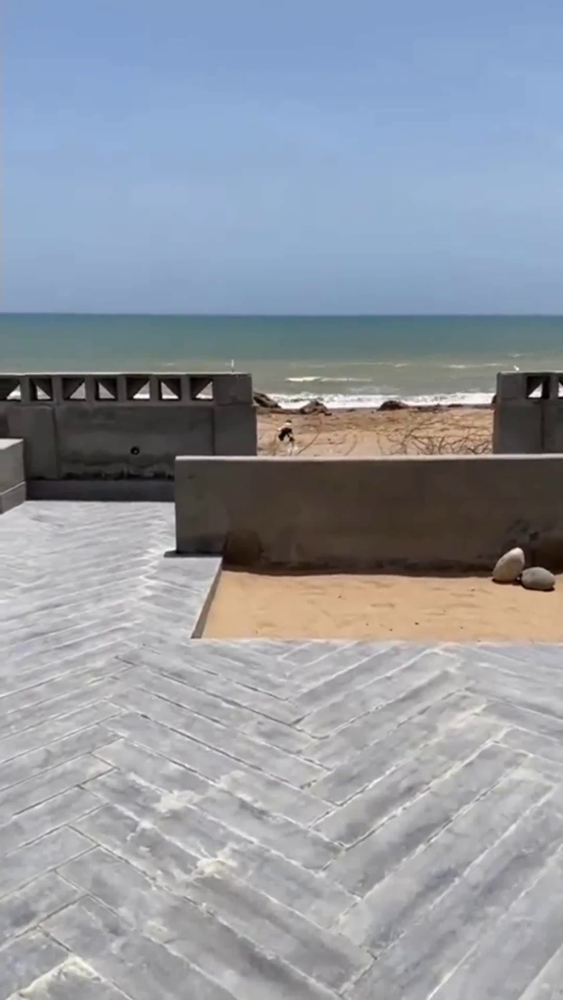

In [29]:
display_handle = display(None, display_id=True)
for img in base64Frames[0::25]:
    display_handle.update(Image(data=base64.b64decode(img.encode("utf-8"))))
    time.sleep(0.025)

In [4]:
PROMPT_MESSAGES = [
    {
        "role": "user",
        "content": [
            "These are frames from a property listing video that I want to upload. Generate a compelling description that describes the rooms, views, and amenities that I can upload along with the video.",
            *map(lambda x: {"image": x, "resize": 768}, base64Frames[0::35]),
        ],
    },
]
params = {
    "model": "gpt-4-vision-preview",
    "messages": PROMPT_MESSAGES,
    "max_tokens": 200,
}


In [5]:
print(PROMPT_MESSAGES)

[{'role': 'user',
  'content': ['These are frames from a property listing video that I want to upload. Generate a compelling description that I can upload along with the video.',
   {'image': '/9j/4AAQSkZJRgABAQAAAQABAAD/2wBDAAIBAQEBAQIBAQECAgICAgQDAgICAgUEBAMEBgUGBgYFBgYGBwkIBgcJBwYGCAsICQoKCgoKBggLDAsKDAkKCgr/2wBDAQICAgICAgUDAwUKBwYHCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgoKCgr/wAARCAd8BDgDASIAAhEBAxEB/8QAHwAAAQUBAQEBAQEAAAAAAAAAAAECAwQFBgcICQoL/8QAtRAAAgEDAwIEAwUFBAQAAAF9AQIDAAQRBRIhMUEGE1FhByJxFDKBkaEII0KxwRVS0fAkM2JyggkKFhcYGRolJicoKSo0NTY3ODk6Q0RFRkdISUpTVFVWV1hZWmNkZWZnaGlqc3R1dnd4eXqDhIWGh4iJipKTlJWWl5iZmqKjpKWmp6ipqrKztLW2t7i5usLDxMXGx8jJytLT1NXW19jZ2uHi4+Tl5ufo6erx8vP09fb3+Pn6/8QAHwEAAwEBAQEBAQEBAQAAAAAAAAECAwQFBgcICQoL/8QAtREAAgECBAQDBAcFBAQAAQJ3AAECAxEEBSExBhJBUQdhcRMiMoEIFEKRobHBCSMzUvAVYnLRChYkNOEl8RcYGRomJygpKjU2Nzg5OkNERUZHSElKU1RVVldYWVpjZGVmZ2hpanN0dXZ3eHl6goOEhYaHiImKkpOUlZaXmJmaoqOkpaanqKmqsrO0tba3uLm6wsPExcbHyMnK0tPU1dbX2Nna4uPk5ebn6Onq8vP09fb

In [ ]:

result = client.chat.completions.create(**params)
print(result.choices[0].message.content)

In [9]:
PROMPT_MESSAGES = [
    {
        "role": "user",
        "content": [
            "These are frames of a video. Create a short voiceover script in the style of David Attenborough. Only include the narration.",
            *map(lambda x: {"image": x, "resize": 768}, base64Frames[0::60]),
        ],
    },
]
params = {
    "model": "gpt-4-vision-preview",
    "messages": PROMPT_MESSAGES,
    "max_tokens": 500,
}

result = client.chat.completions.create(**params)
print(result.choices[0].message.content)

In the teeming urban landscape, a river of concrete and asphalt cuts through the heart of the city. Here, the human inhabitants traverse the metal bridges above, while machines roar on their pathways beside, a testament to mankind's mastery over nature. But amidst this conquest, a ribbon of green persists. Trees, shrubs, and flowering plants cling to the shores of this serene waterway, an oasis of life in the steel cityscape. Walking along this path, one witnesses the harmonious coexistence of the human world and the natural realm, a reminder of the delicate balance we must maintain. As the city breathes around us, the water calmly mirrors the azure sky, untroubled by the haste of city life, offering solace to those who seek a moment of peace in the bustle of human existence.


In [33]:
input = "Welcome to your coastal retreat where modern simplicity meets beachfront living. This exquisite property, showcased in a comprehensive video tour, begins with a warm invitation through a grand wooden doorway, set in an elegant facade that beautifully harmonizes with the natural textures that surround it. Inside, the home unfolds into an open-plan living space bathed in natural light, where the sleek floor tiles reflect the calm, muted tones of the walls, creating a serene atmosphere that soothes the soul. The state-of-the-art kitchen is a testament to functional design, featuring pristine white cabinetry offset by stylish countertops and accompanied by high-quality appliances ready to cater to your culinary adventures. Venture further to discover a spacious bedroom sanctuary, promising rest and relaxation with its minimalist decor, ample natural lighting, and a harmonizing color palette that induces tranquility. The well-appointed bathroom bespeaks practical elegance, offering all the amenities needed for your comfort."

In [10]:
response = requests.post(
    "https://api.openai.com/v1/audio/speech",
    headers={
        "Authorization": f"Bearer {os.environ['OPENAI_API_KEY']}",
    },
    json={
        "model": "tts-1-1106",
        "input": result.choices[0].message.content,
        "voice": "onyx",
    },
)

audio = b""
for chunk in response.iter_content(chunk_size=1024 * 1024):
    audio += chunk
Audio(audio)

In [34]:

response = requests.post(
    "https://api.openai.com/v1/audio/speech",
    headers={
        "Authorization": f"Bearer {os.environ['OPENAI_API_KEY']}",
    },
    json={
        "model": "tts-1-1106",
        "input": input,
        "voice": "nova",
    },
)

audio2 = b""
for chunk in response.iter_content(chunk_size=1024 * 1024):
    audio2 += chunk
Audio(audio2)

In [12]:
def save_audio(path: str, audio):
    with open(path, 'wb') as f:
        f.write(audio)

In [18]:
print(len(list(response)))

7872
